In [ ]:
import numpy as np
import cv2

def brute_force_matcher(desc1, desc2, k=2):    

    dists = np.linalg.norm(desc1[:, np.newaxis, :] - desc2[np.newaxis, :, :], axis=-1)
    
    top_k_idx = np.argsort(dists, axis=1)[:, :k]
    top_k_dists = np.take_along_axis(dists, top_k_idx, axis=1)
    
    matches = []
    for i in range(desc1.shape[0]):
        for j in range(k):
            matches.append(cv2.DMatch(i, top_k_idx[i,j], top_k_dists[i,j]))
            
    return matches

In [ ]:
from google.colab.patches import cv2_imshow

def sift_match(img1, img2, use_custom_matcher):
  sift = cv2.SIFT_create()
  kp1, desc1 = sift.detectAndCompute(img1, None)
  kp2, desc2 = sift.detectAndCompute(img2, None)

  matches = None

  if use_custom_matcher:
    matches = brute_force_matcher(desc1, desc2)
  else:
    bf = cv2.BFMatcher()
    matches = bf.match(desc1, desc2)

  matches = sorted(matches, key=lambda x: x.distance)

  img_matches = cv2.drawMatches(img1, kp1, img2, kp2, matches[:10], None, flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

  cv2_imshow(img_matches)

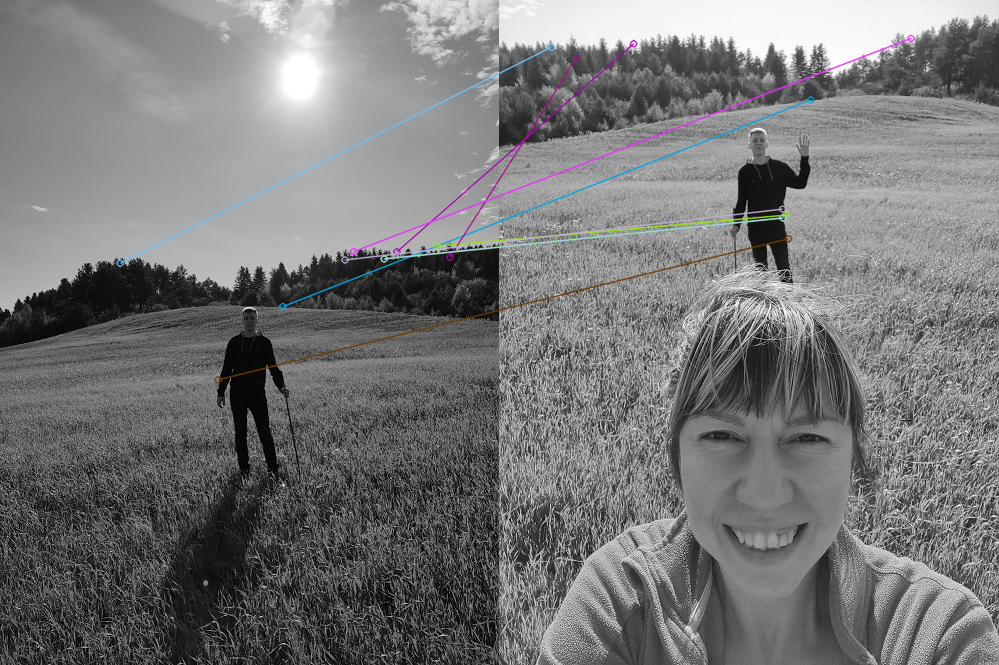

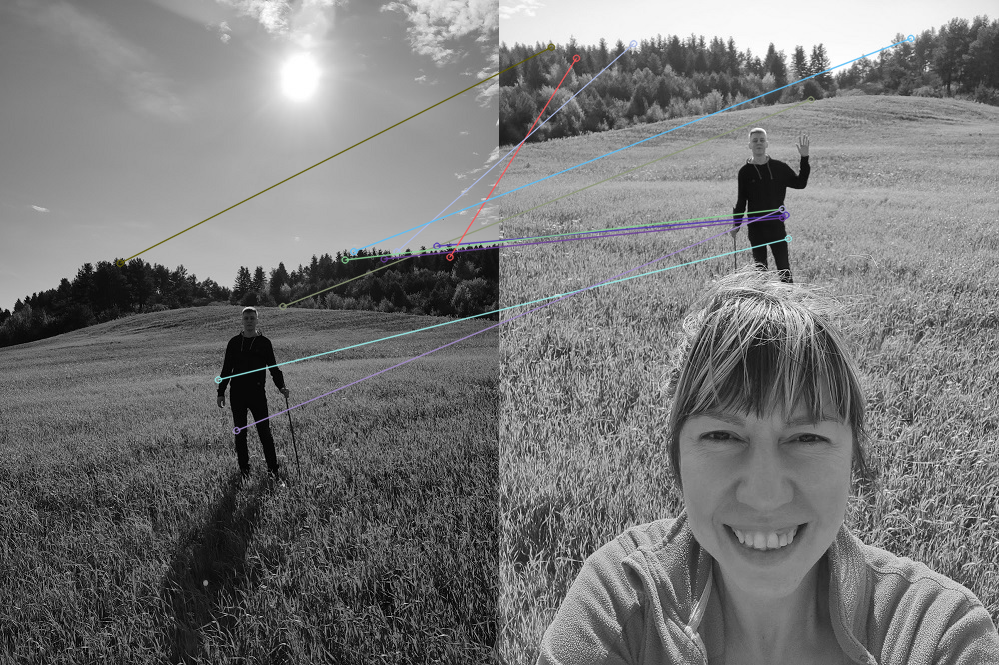

In [ ]:
img21 = cv2.imread('21.jpg', cv2.IMREAD_GRAYSCALE)
img22 = cv2.imread('22.jpg', cv2.IMREAD_GRAYSCALE)

sift_match(img21, img22, True)
sift_match(img21, img22, False)

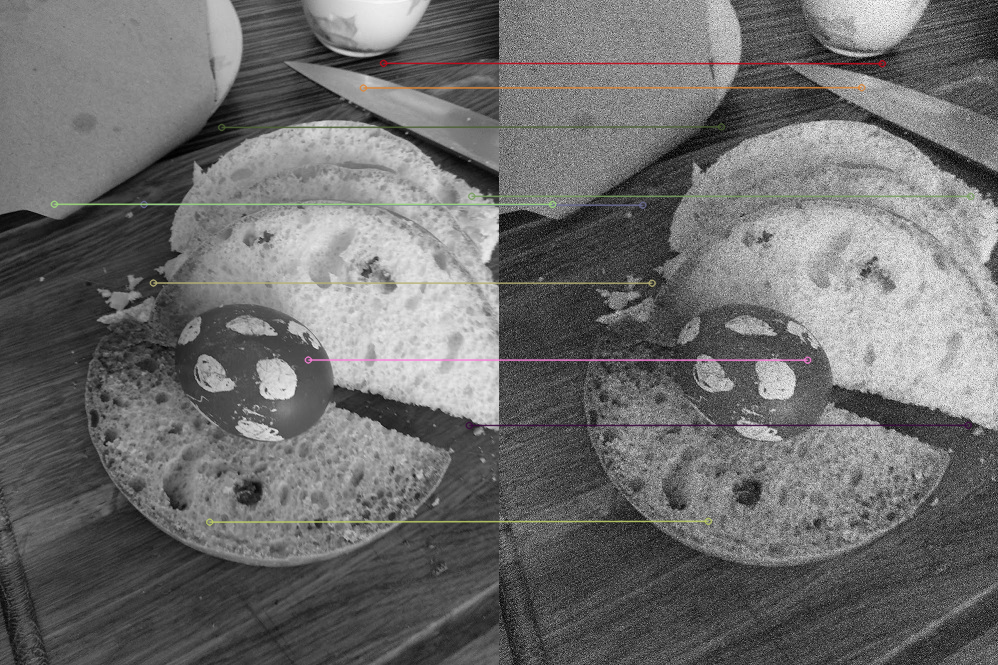

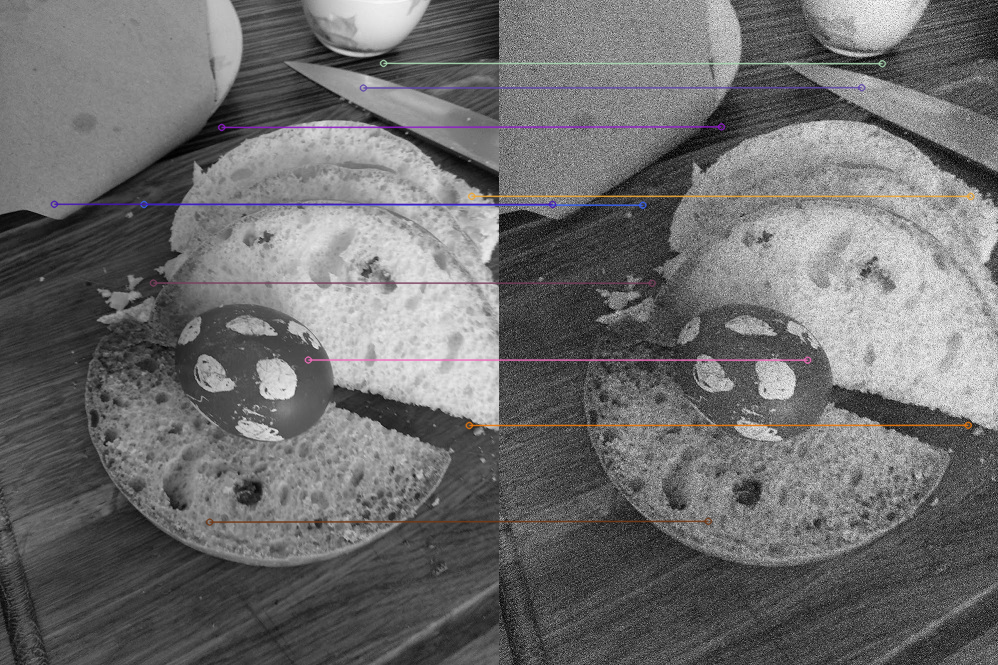

In [ ]:
img31 = cv2.imread('31.jpg', cv2.IMREAD_GRAYSCALE)
img32 = cv2.imread('32.jpg', cv2.IMREAD_GRAYSCALE)

sift_match(img31, img32, True)
sift_match(img31, img32, False)

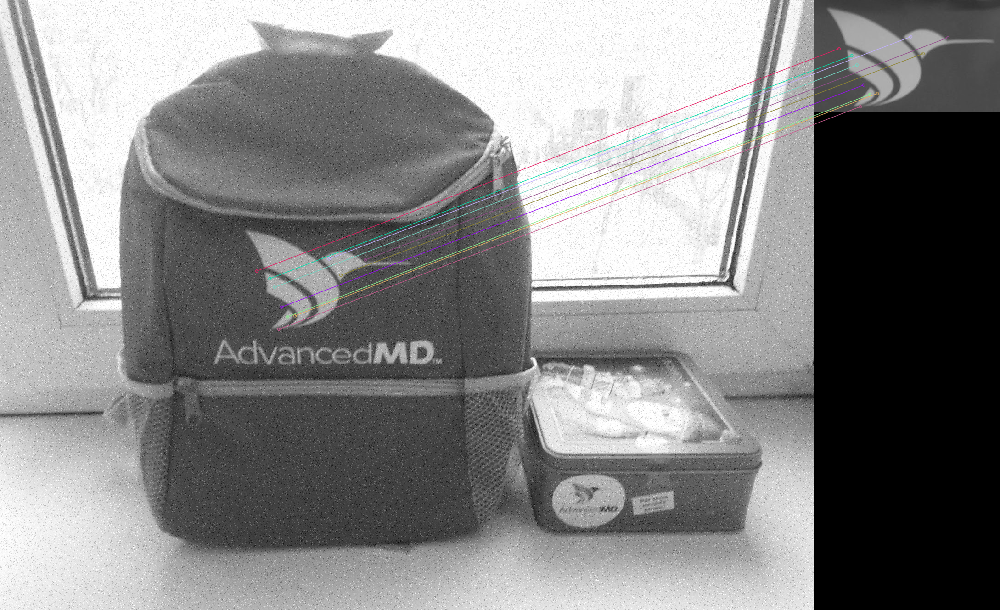

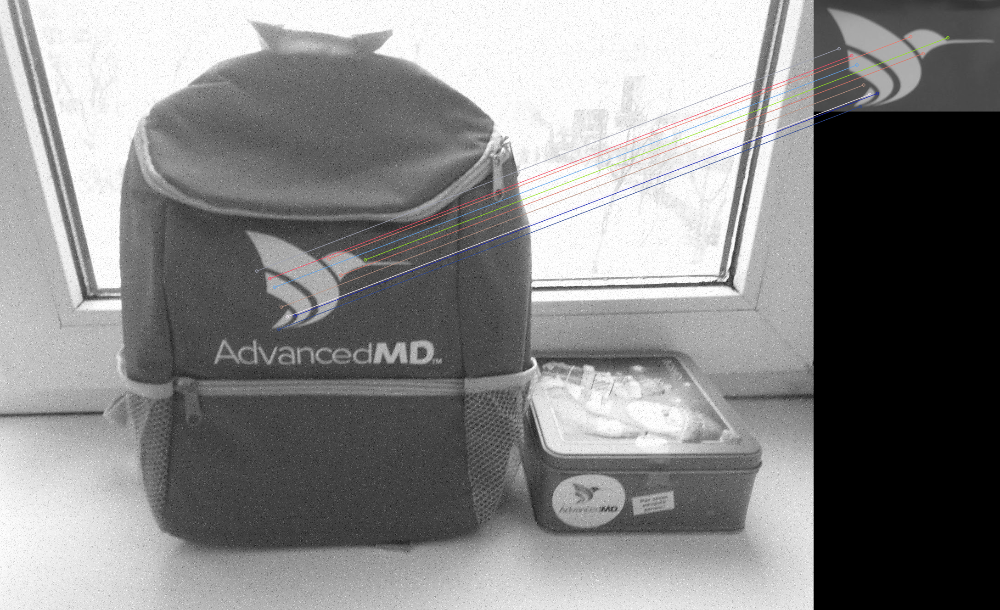

In [ ]:
img11 = cv2.imread('11.jpg', cv2.IMREAD_GRAYSCALE)
img12 = cv2.imread('12.jpg', cv2.IMREAD_GRAYSCALE)

sift_match(img11, img12, True)
sift_match(img11, img12, False)